# Partie 2/3 : Deep Learning pour les données séquentielles

François HU - Data scientist au DataLab de la Société Générale Assurances - *19/11/19*

https://nbviewer.jupyter.org/github/curiousML/DSA/tree/master/text_mining/

In [18]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## Introduction

<font color = "grey">*cacher le code</font>

In [1]:
from IPython.display import HTML, Image
HTML('''<script>code_show=true; function code_toggle() {if (code_show){$('div.input').hide();} else {$('div.input').show();}code_show = !code_show} $( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="cacher / afficher code"></form>''')

**pourquoi les modèles séquentiels ?**

- classification de textes / analyse de sentiment

- Named Entity Recognition (NER)

- génération de textes / de musiques

- traducteur automatique

- ...

**pourquoi pas les réseaux de neurones standard ?**

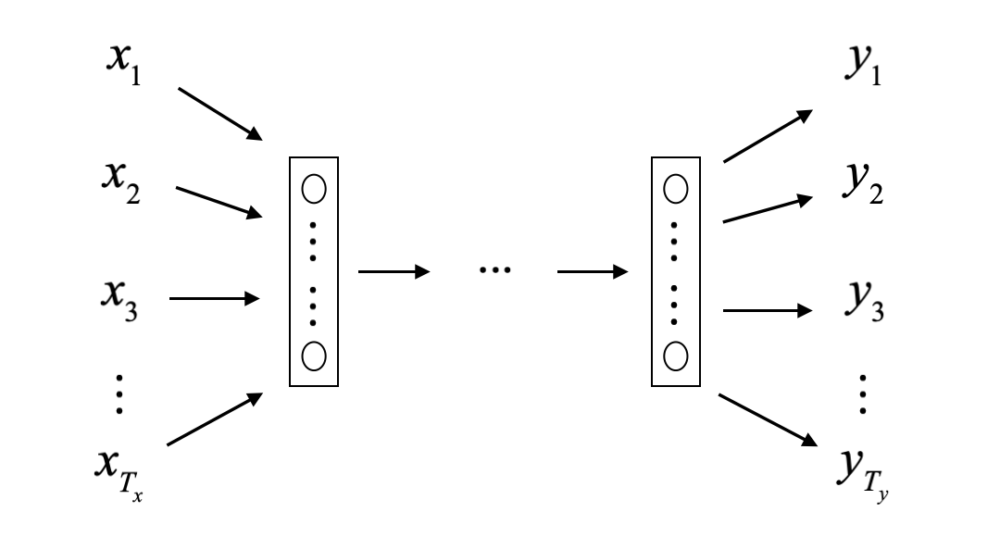

In [6]:
display(Image("img/NN.png", width=500, height = 200))

- inputs / outputs peuvent être de **tailles différentes**

- ne tient pas en compte des **différentes positions** des mots

## 1. Recurrent Neural Networks (RNN)
<font color = "grey">*cacher le code</font>

In [2]:
from IPython.display import HTML, Image
HTML('''<script>code_show=true; function code_toggle() {if (code_show){$('div.input').hide();} else {$('div.input').show();}code_show = !code_show} $( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="cacher / afficher code"></form>''')

### Modèle RNN "classique"

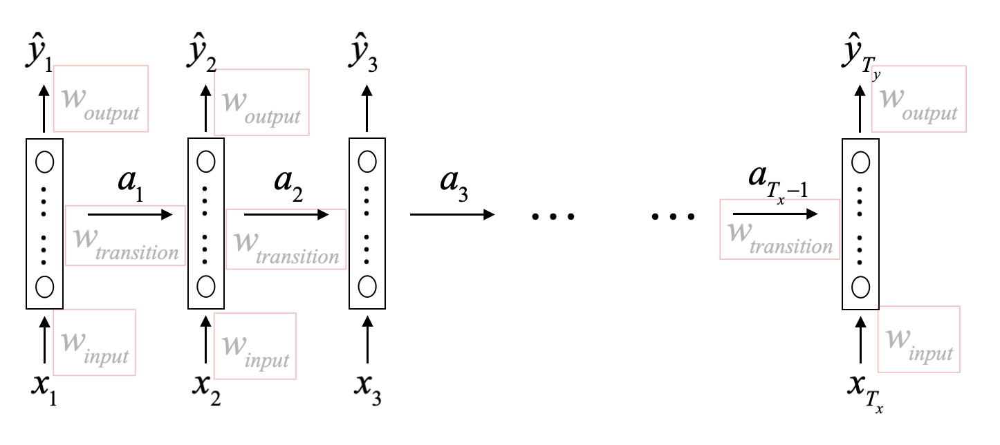

In [10]:
display(Image("img/RNNplus.png", width=750, height = 200))

- possibilité de manipuler les **séquences de taille variable**

- tout calcul futur **tient compte des calculs passés**

- les poids / **paramètres sont partagés** dans le temps

**Propagation avant** (forward propagation) d'un RNN

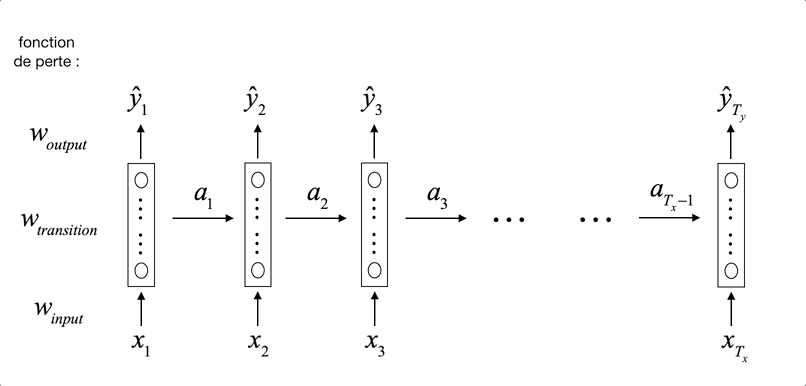

In [11]:
display(Image("img/RNNforward.gif.png", width=700, height = 200))

- étant donné les poids $w_{intput}$, $w_{transition}$ et $w_{output}$, nous allons calculer $a_t$, $\hat{y}_t$ et $l_t = l(y_t,\hat{y}_t)$ 

- **fonction de perte** au temps $t$ (exemple) : $l(y_t, \hat{y}_t) \leftarrow$ cross-entropy

**Un peu de maths**

- $a_0 = \vec{0}$

- $a_1 = \sigma_{transition}(w_{transition}\cdot a_0 + w_{input}\cdot x_1)$

- $\hat{y}_1 = \sigma_{output}(w_{output}\cdot a_1)$

- $a_t = \sigma_{transition}(w_{transition}\cdot a_{t-1} + w_{input}\cdot x_{t})$

- $\hat{y}_t = \sigma_{output}(w_{output}\cdot a_t)$

- **fonctions d'activation** (exemples) : $\sigma_{output} \leftarrow$ tanh ou ReLu,     $\ \ \sigma_{transition} \leftarrow$ sigmoid ou softmax

**Propagation arrière** (back-propagation) d'un RNN

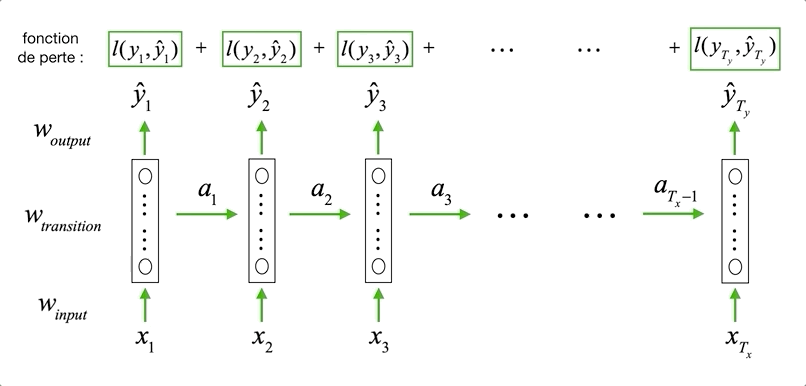

In [12]:
display(Image("img/RNNbackprop.gif.png", width=700, height = 200))

- **mettre à jour les poids** $w_{intput}$, $w_{transition}$ et $w_{output}$ afin de minimiser les fonctions de pertes

- **solution** : mise à jour des poids **par descente de gradient**

### D'autres architectures RNN

Architecture N-N, N-1, 1-N, N-M

**1. Architecture N-N :**

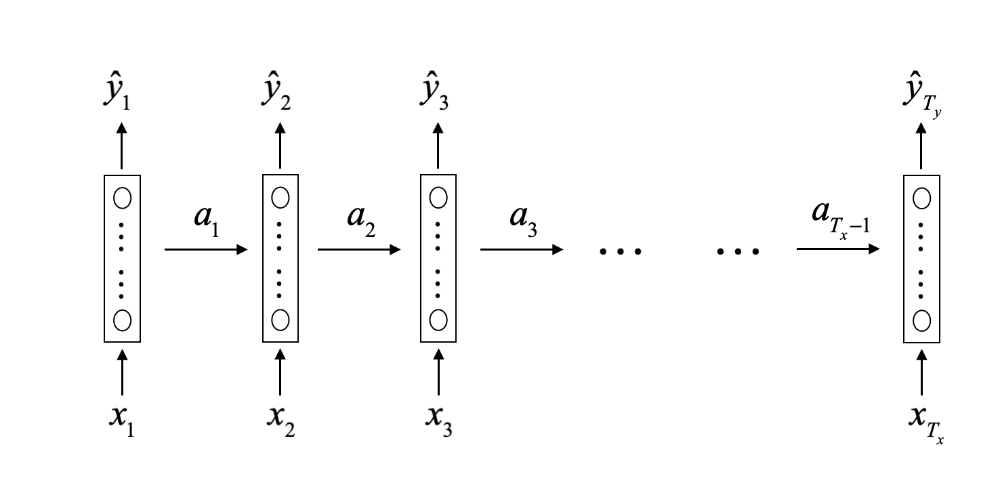

In [4]:
display(Image("img/RNN.png", width=700, height = 200))

- Named entity recognition (NER)

**2. Architecture N-1 :**

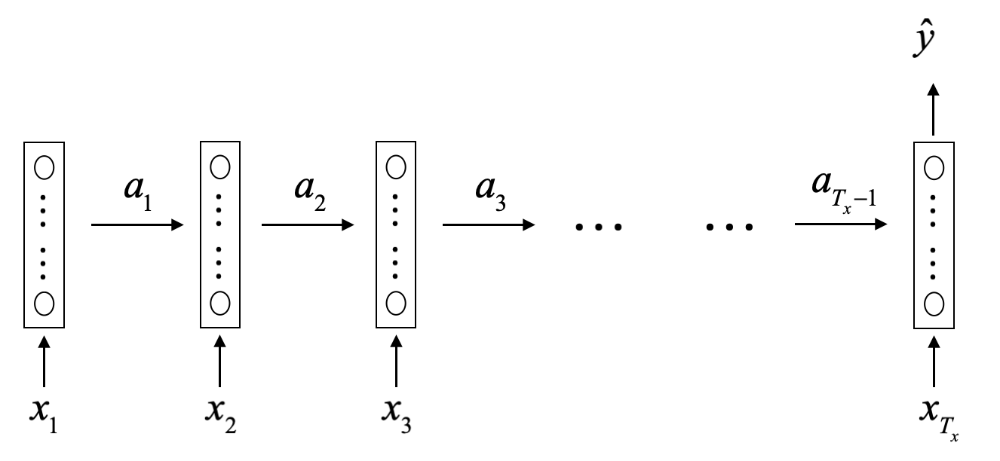

In [5]:
display(Image("img/RNN_N_1.png", width=700, height = 200)

- classification de textes (dont classification de sentiment)

**3. Architecture 1-N :**

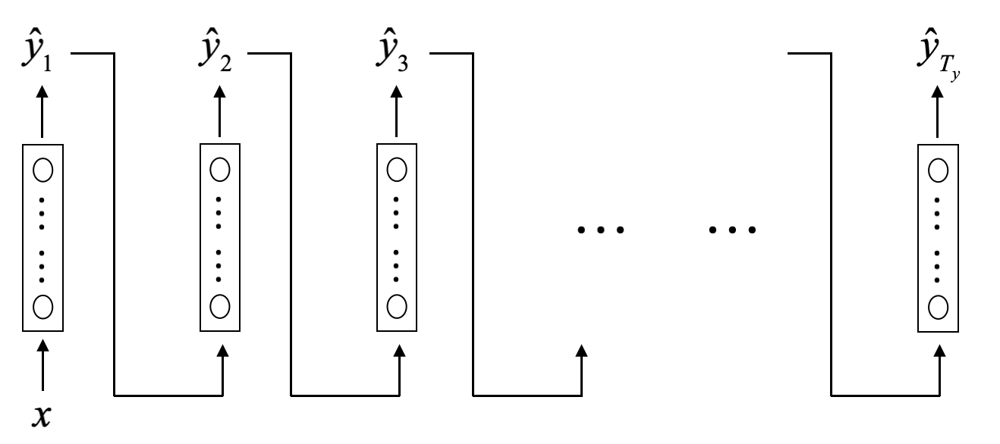

In [8]:
display(Image("img/RNN_1_N.png", width=700, height = 200))

- génération de séquences (textes, musiques, ...)

**4. Architecture N-M :**

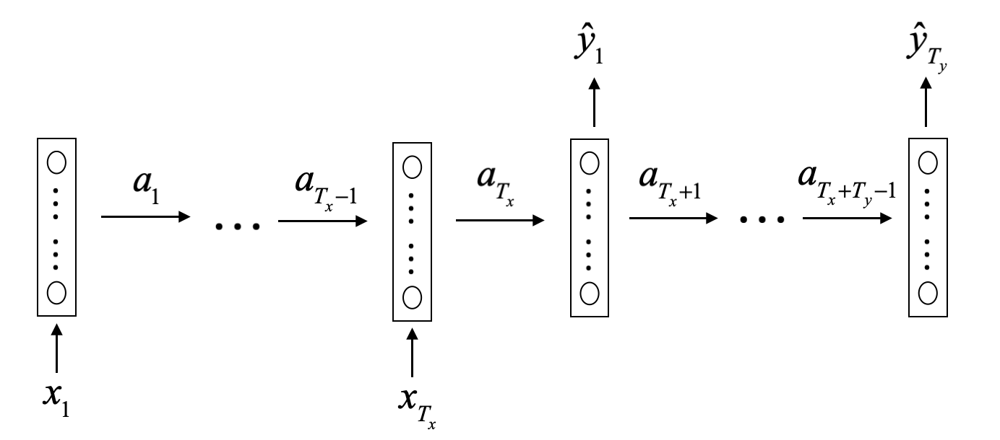

In [7]:
display(Image("img/RNN_N_M.png", width=700, height = 200))

- traducteur automatique

### Modèle Bidirectional-RNN (BRNN)

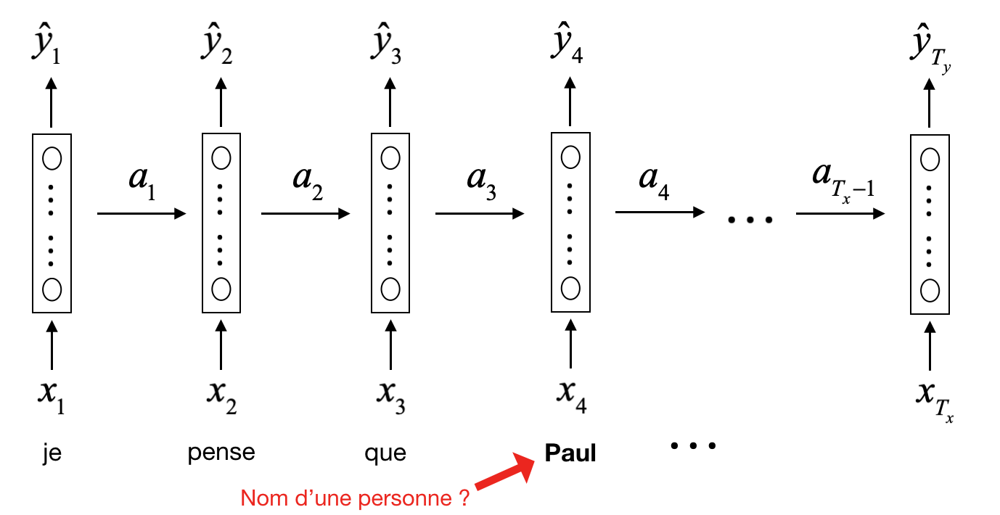

In [15]:
display(Image("img/BRNNmotiv.png", width=580, height = 200))

- oui, avec l'exemple : Je pense que **Paul** <font color = "orange">est né le 10 juillet 1989</font>

- <font color ="red"><b>non</b></font>, avec l'exemple : Je pense que **Paul** <font color = "orange">est une boulangerie fondée en 1889</font>

$\implies$ souvent la prédiction à un instant doit tenir compte des instants futurs $\implies$ **BRNN**

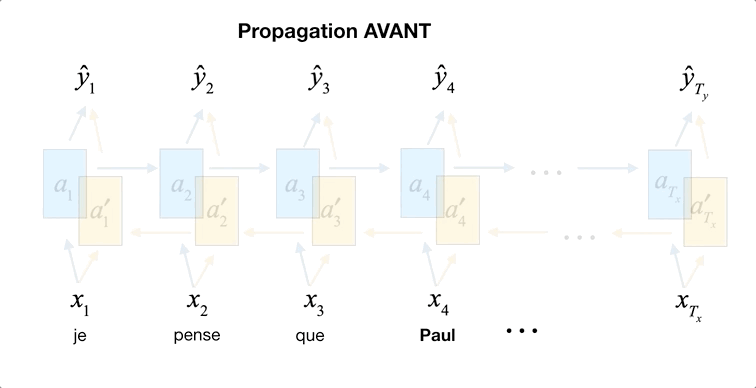

In [21]:
display(Image("img/BRNNforward.gif.png", width=580, height = 200))

- étant donné les poids $w_{intput}$, $w'_{intput}$, $w_{transition}$, $w'_{transition}$ et $w_{output}$, nous **calculons** :
    - les activations <font color="blue">$a_t$</font> et les activation <font color = "orange">$a'_t$</font> 
    - puis les prédictions $\hat{y}_t = \sigma(w_{output}\cdot [a_t, a'_t])$ et les fonctions de perte $l_t$

- **propagation arrière** : mise à jour des poids **par descente de gradient** afin de minimiser les pertes

### Modèle deep RNN

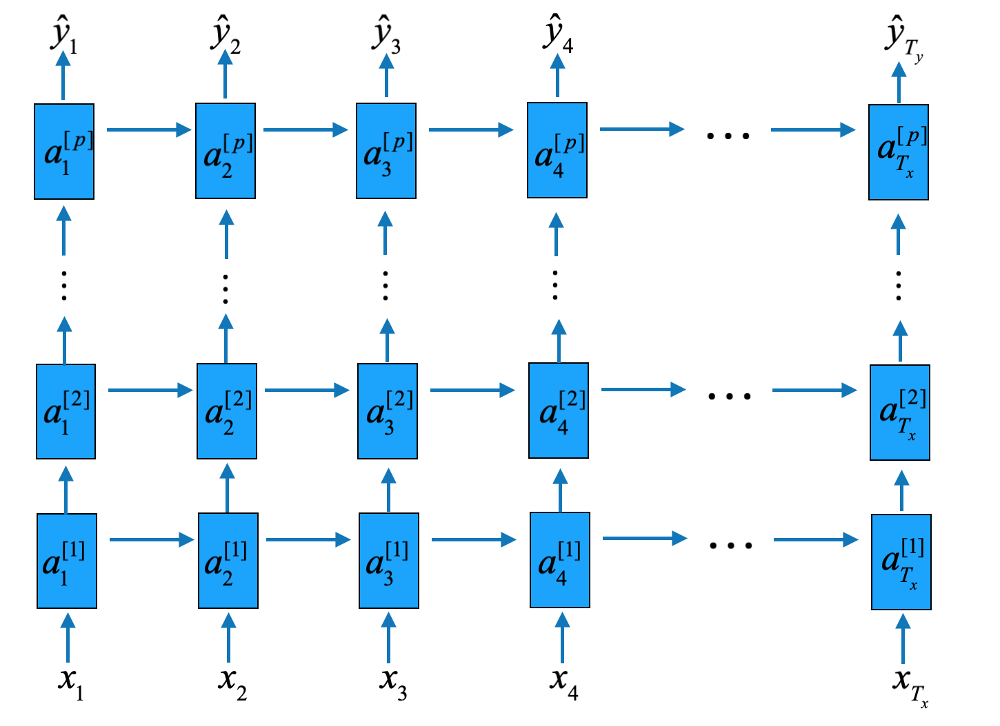

In [4]:
display(Image("img/DRNN.png", width=480, height = 200))

- **empiler les couches cachées**

- généralement **entre 2 et 4 couches cachées** (car grande complexité de calcul)

**Couches de reséaux de neurones supplémentaires après RNN**

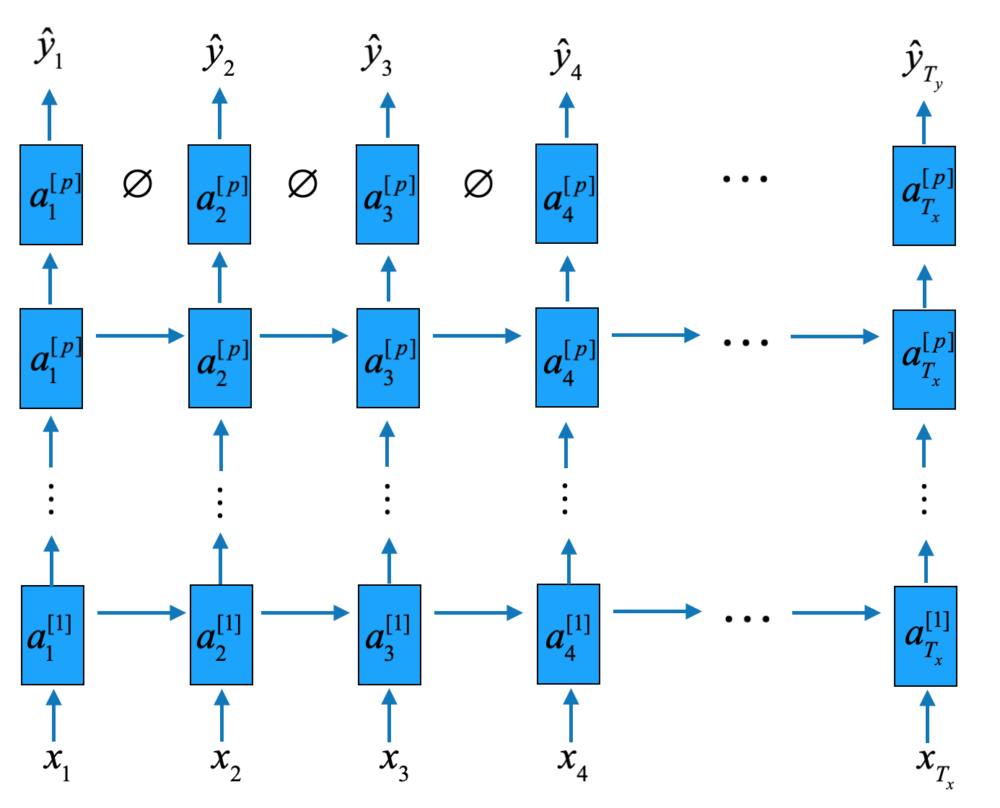

In [5]:
display(Image("img/DRNNplus.png", width=550, height = 200))

- ces couches supplémentaires n'ont **pas de connections horizontales**

## Problème de la disparition du gradient

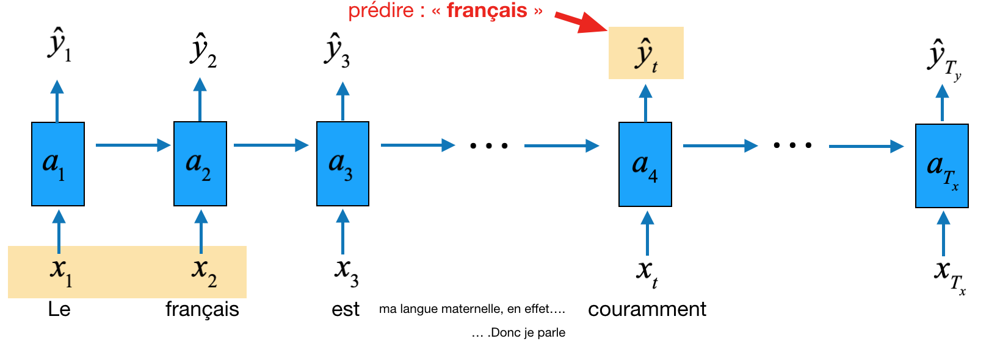

In [9]:
display(Image("img/vanishinggradient.png", width=750, height = 200))

- les RNN classiques ne sont pas très bon pour les **dépendances à long terme** à cause de la disparition du gradient

- **solution** : LSTM / GRU (voir <font color = "red">section suivante</font>) qui sont **des variantes des RNN**

**Résumé :**

- Modèle RNN "classique"

- D'autres architectures RNN

- Modèle Bidirectional-RNN (BRNN)

- Modèle deep RNN

## 2. [ OPTION ] Dépendances à long terme
<font color = "grey">*cacher le code</font>

In [2]:
from IPython.display import HTML, Image
HTML('''<script>code_show=true; function code_toggle() {if (code_show){$('div.input').hide();} else {$('div.input').show();}code_show = !code_show} $( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="cacher / afficher code"></form>''')

### Long Short Term Memory (LSTM)

### Gated Reccurent Unit (GRU)